# Programming for data analysis - 2024
## Salyp Olga 


<img style="float: right;" src="../figures/pixar.jpg">

## Sort the birds!

The goal of this project is to sort (automatically) audio files that correspond to the recording of adult or juvenile songbirds. If you listen to the audio files, you will hear that the sound is quite different between an adult (song) and a juvenile (babbling). This means we can probably process the audio files in order to decide if it corresponds to an adult or a juvenile and the goal is thus to write a function `songsort("./some-path/")` that will automatically sort all the files present in `some-path` and label them accordingly.

However, to do so, we'll need to manipulate a lot of different notions (such as resampling, filtering, enveloppe, auto-correlation, fit) and to check our implementation is correct. So let's start with a sample adult and juvenile audio file.

**Data** is available on [figshare](https://doi.org/10.6084/m9.figshare.14611791.v1). Once downloaded, you can unzip it in the project directory (where you have your notebook saved). Make sure the directory is named `records`.



In [12]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [16]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import scipy.signal as sgn
from scipy.io import wavfile
from IPython.display import Audio, display

### 1. Loading data

The first thing to do is to load our data from a local file that must be present in your `data` directory. To do that, we'll write a `get_local_data` function that reads a `wav` filename (`wav` file are sound files encoded in the [Waveform audio file format](https://fr.wikipedia.org/wiki/Waveform_Audio_File_Format)) using a dedicated function of scipy.

In [26]:
def get_data(filename = None):
    rate, S = wavfile.read(filename)
    return rate, S

In [29]:
filename = "C:/Users/huawei/Documents/M2 Python course/PythonProject_records/record-001.wav"

rate, S = get_data(filename)
frequency = rate/1000
length = len(S)

print("Frequency: {:.1f}kHz".format(Frequency))
print("Length: {}".format(Length))

Frequency: 44.1kHz
Length: 530833


In [34]:
# the duration of the signal
duration = Length / Frequency
print("Duration on the signal recording is {} sec".format(duration))

Duration on the signal recording is 12037.02947845805 sec



### 2. Visualizing data



In [37]:
# to generate the time vector T
T = np.linspace(0, length/rate, num = length)
print(T[:5])


[0.00000000e+00 2.26757797e-05 4.53515594e-05 6.80273390e-05
 9.07031187e-05]


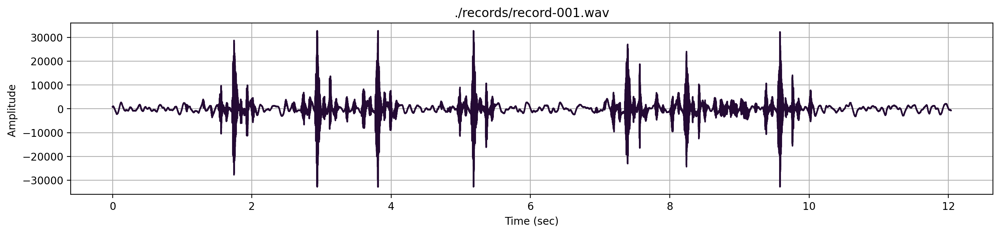

[0.00000000e+00 2.26757797e-05 4.53515594e-05 ... 1.20369841e+01
 1.20370068e+01 1.20370295e+01]
[ 744  743  738 ... -686 -688 -689]


In [40]:
T = np.linspace(0, length/rate, num = length)
plt.figure(figsize = (16,3))
plt.plot(T, S, color = '#240A34')
plt.xlabel("Time (sec)")
plt.ylabel("Amplitude ")
plt.title("./records/record-001.wav")
plt.grid()
plt.show()
print(T)
print(S)

Length of audio data: 530833
Audio data sample range: -32768 32767


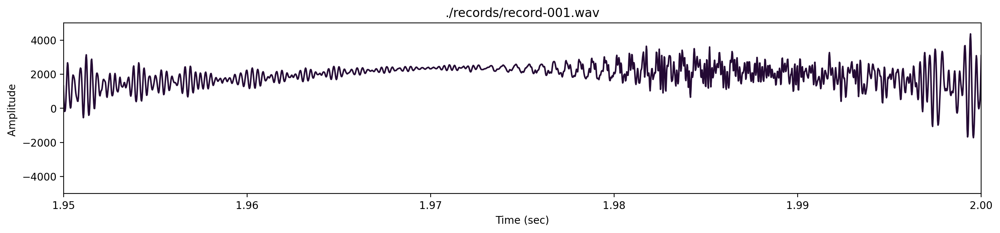

In [43]:
print("Length of audio data:", length)
print("Audio data sample range:", np.min(S), np.max(S))

plt.figure(figsize = (16, 3))
plt.plot(T, S, color = '#240A34');
plt.xlim(1.95, 2.0);
plt.ylim(-5000,5000);
plt.xlabel("Time (sec)")
plt.ylabel("Amplitude ")
plt.title("./records/record-001.wav")
plt.show()

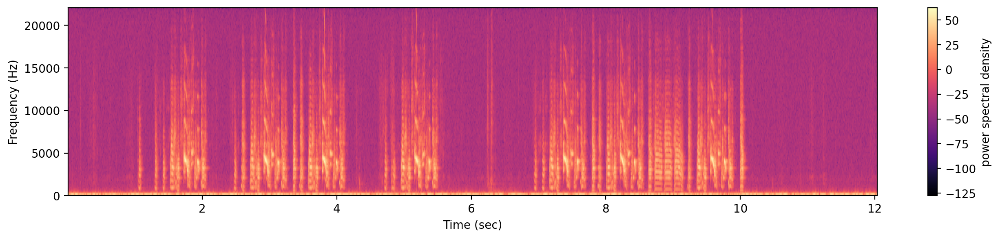

In [46]:
#matplotlib.pyplot.specgram(x, NFFT=None, Fs=None, Fc=None, detrend=None, window=None, noverlap=None, cmap=None, xextent=None, pad_to=None, sides=None, scale_by_freq=None, mode=None, scale=None, vmin=None, vmax=None, *, data=None, **kwargs)[source]
plt.figure(figsize=(16,3))
plt.specgram(S, Fs = rate, cmap = "magma");
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label = "power spectral density")

In [49]:
# Display a widget to play the sound
display(Audio(filename))

### 3. Denoising the signal



<a list of 2 Line2D objects>


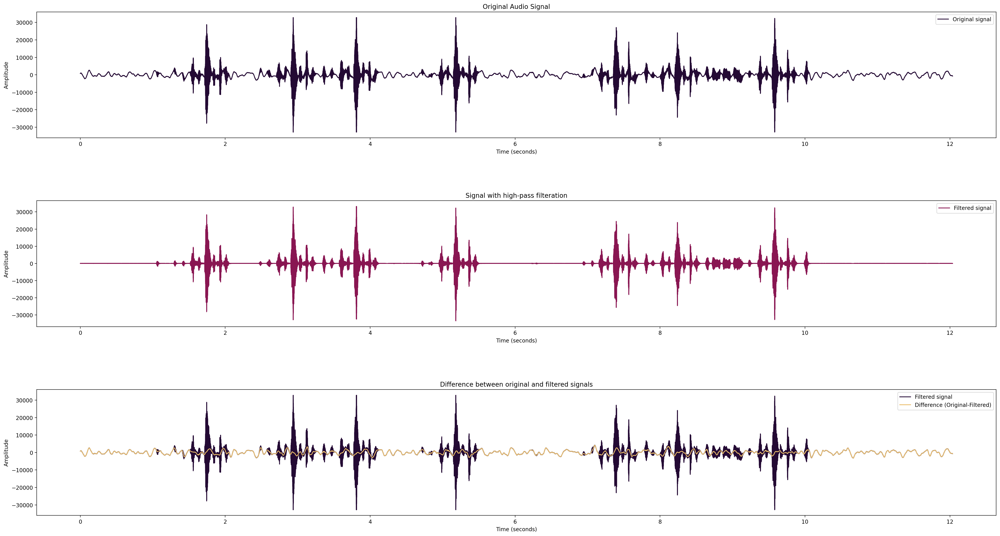

In [52]:
# highpass filter in the format [b,a] at a cut-off frequency of 500Hz

cut_off_frequency = 500
order = 5
freq_nyq = 0.5 * rate # This Nyquist Frequency normalizes the cut-off frequency relative to the Nyquist frequency
norm_cut_off = cut_off_frequency / freq_nyq
b, a = sgn.butter(N = order, Wn = norm_cut_off, btype = 'high', analog = False) #analog - When True, return an analog filter, otherwise a digital filter is returned     
filtered_signal = sgn.filtfilt(b, a, S)

#  the difference between the original and the filtered signals
difference_between_signals = S - filtered_signal

# and the filtered signal and the calculated difference
length = len(S)
T = np.linspace(0, length/rate, num = length) #numpy.linspace(start, stop, num=50)

plt.figure(figsize = (26, 14))
plt.subplot(3, 1, 1) #subplot(nrows, ncols, index, **kwargs)
plt.plot(T, S, label="Original signal", color = '#240A34')
plt.title('Original Audio Signal')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(T, filtered_signal, label="Filtered signal", color = '#891652')
plt.title('Signal with high-pass filteration')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(T, S, label="Filtered signal", color = '#240A34')
plt.plot(T, difference_between_signals, label = "Difference (Original-Filtered)", color = '#EABE6C')
plt.title('Difference between original and filtered signals')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.legend()

plt.tight_layout()
plt.subplots_adjust(hspace = 0.5)
print(plt.gca().get_lines()) #Check current axes lines
plt.show()
# Keep in mind we will be using the *filtered* signal from now on!
#this is '#891652' color

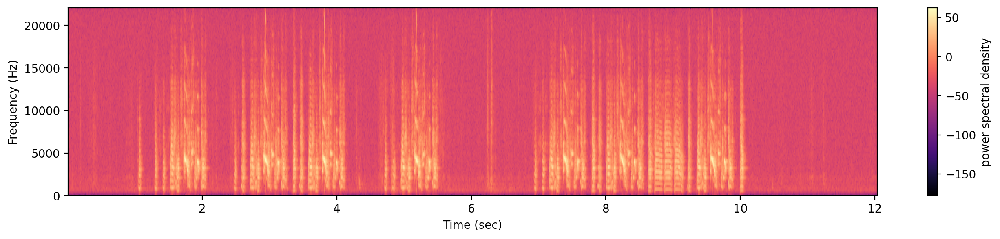

In [53]:
# the specgram function again to plot the filtered signal
plt.figure(figsize=(16,3))
plt.specgram(filtered_signal, Fs = rate, cmap = "magma");
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label = "power spectral density")

In [55]:
# Noisy version
display(Audio(S, rate=rate));

In [56]:
# Denoised signal
display(Audio(filtered_signal, rate=rate));


### 4. Smoothing the signal

by averaging each value with neighboring values, using a Gaussian window. 

In [61]:
# Duration of the time window over which to smooth the signal
dt = 0.025
trange = int(dt * rate)

# Standard deviation of the gaussian
sigma = trange/4

# Actual temporal window over which to compute the Gaussian
window = np.arange(-trange//2, trange//2)
print(window)

# Gaussian function over window and standard deviation sigma
gaussian = np.exp(-(window/sigma)**2)


[-551 -550 -549 ...  548  549  550]


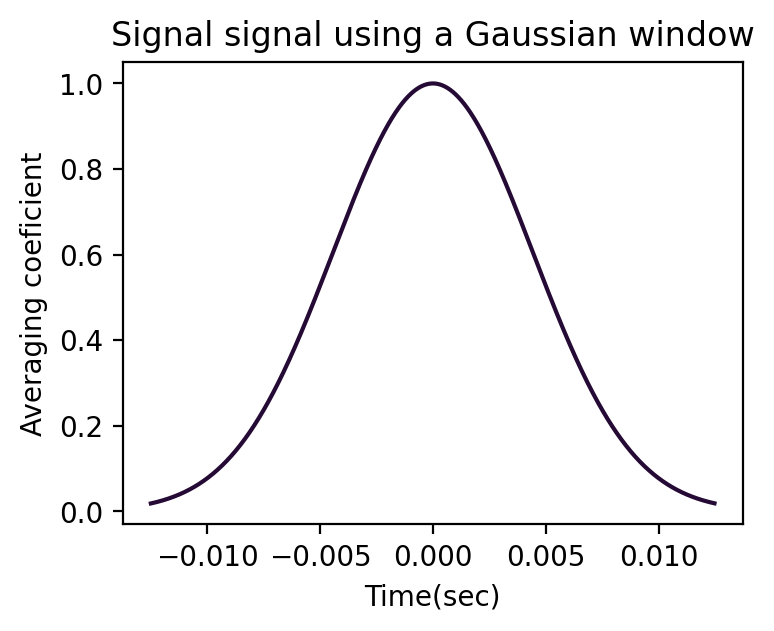

In [65]:
# Plot the Gaussian 
plt.figure(figsize = (4, 3))
plt.plot(window/rate, gaussian, color = '#240A34')
plt.title("Signal signal using a Gaussian window")
plt.xlabel("Time(sec)")
plt.ylabel("Averaging coeficient")
plt.show()

Now, lets compte the envelope with convolution product:
$(f * g)(t) \triangleq\ \int_{-\infty}^\infty f(t-\tau) g(\tau)\, d\tau$



#### The Gaussian function:

$$
G(x) = \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{(x - \mu)^2}{2\sigma^2}}
$$

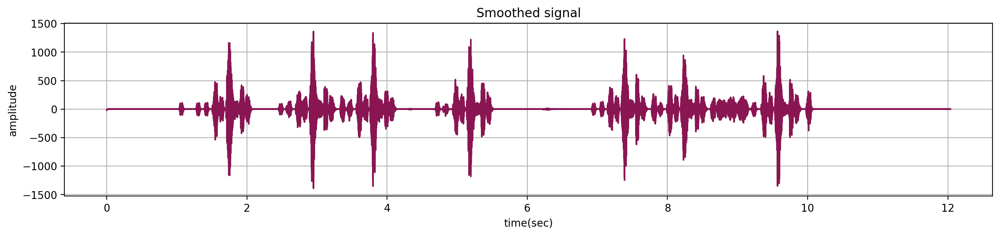

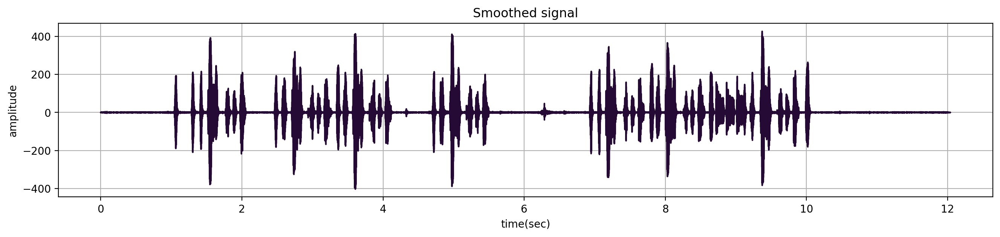

In [69]:
# Smooth the signal using the numpy convolution by Gaussian window function for weighted averaging and reduction of artifacts: 
def gaussian_kernel(size, sigma = 1):
    kernel = np.fromfunction(lambda x: (1/ (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - (size - 1) / 2) / sigma) ** 2), (size,)) # (size,) means that a 1D array w/ size elements is creating
    return kernel / np.sum(kernel)  # Normalization

kernel_size = 100  # Size of the kernel - number of points in the Gaussian kernel
sigma = 10  # Standard deviation of the Gaussian distribution
gaussian_ker = gaussian_kernel(kernel_size, sigma) # one-dimensional array of weights; values closer to center have higher weights; function normalizes the kernel - sum of the weights equals 1.

# Application of the convolution with the Gaussian kernel
signal_smoothed_gaussian = np.convolve(filtered_signal, gaussian, mode = 'same') # with 'same' the output will have the same length as the input signal
signal_smoothed_gaussian_ker = np.convolve(filtered_signal, gaussian_ker, mode = 'same') # just curious, I wanna compare these to methods

plt.figure(figsize = (16,3))
plt.title("Smoothed signal")
plt.xlabel("time(sec)")
plt.ylabel("amplitude")
plt.plot(T, signal_smoothed_gaussian, color = '#891652')  
plt.grid()

plt.figure(figsize = (16,3))
plt.title("Smoothed signal")
plt.xlabel("time(sec)")
plt.ylabel("amplitude")
plt.plot(T, signal_smoothed_gaussian_ker, color = '#240A34')  
plt.grid()
plt.show()


the signal and it enveloppe variations should be aligned.  


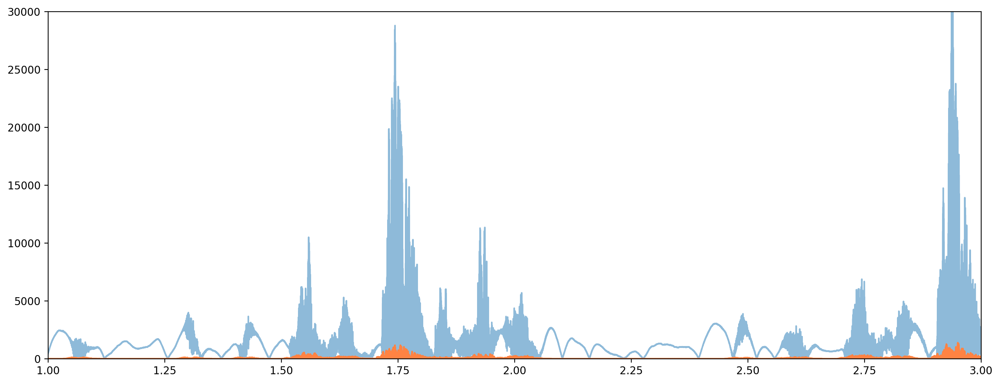

In [72]:
# Display the raw signal and the spectrogram
T = np.linspace(0, length/rate, num = length)
plt.figure(figsize = (16,6))
plt.plot(T, abs(S), alpha = 0.5) # original signal
plt.plot(T, abs(signal_smoothed_gaussian), color = '#FF8343' ) # convolution
plt.xlim(1, 3)
plt.ylim(0, 30000)

plt.show()


### 5. Resampling & Auto-correlation


In [75]:
E1 = signal_smoothed_gaussian[::1]
E10 = signal_smoothed_gaussian[::10]
E100 = signal_smoothed_gaussian[::100]
E1000 = signal_smoothed_gaussian[::1000]
E10000 = signal_smoothed_gaussian[::10000]
print(len(E1), len(E10), len(E100), len(E1000), len(E10000))

530833 53084 5309 531 54


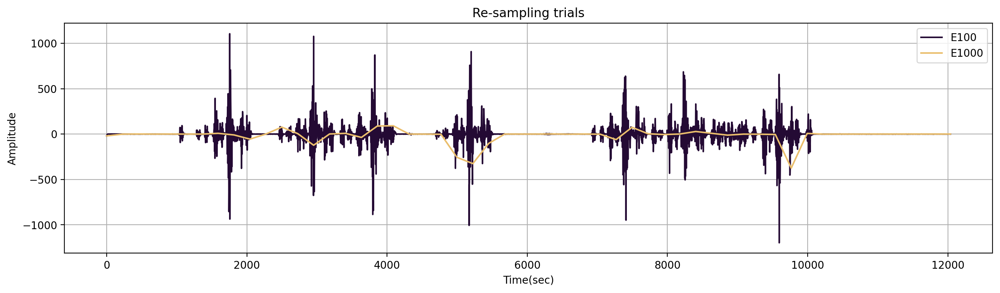

In [77]:
E100 = E100.astype(np.float32)
E10000 = E10000.astype(np.float32)

plt.figure(figsize = (16, 4))
plt.plot(np.linspace(0, duration, len(E100)), E100, label = "E100", color = '#240A34')
plt.plot(np.linspace(0, duration, len(E10000)), E10000, label = "E1000", color = '#EABE6C')
plt.xlabel("Time(sec)")
plt.ylabel("Amplitude")
plt.title("Re-sampling trials")
plt.legend()
plt.grid()
plt.show()


In [79]:
E = signal_smoothed_gaussian[::100]
Ac = np.correlate(E, E, mode='same') / (E**2).sum()

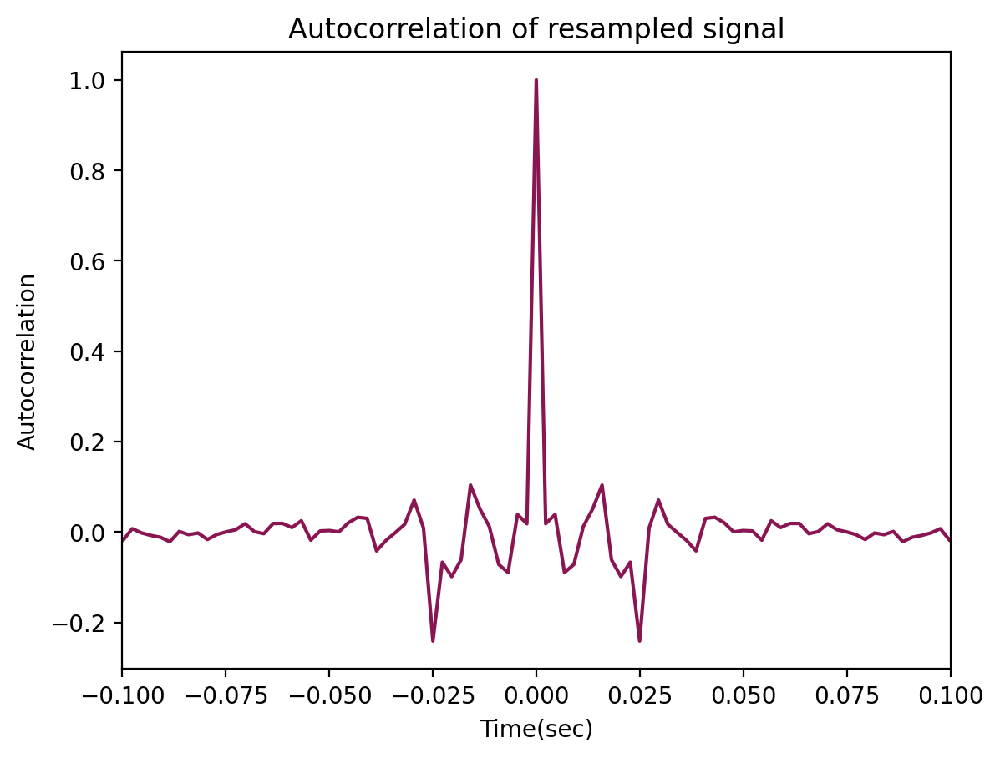

In [82]:
T = .5*np.linspace(-len(S)/rate, +len(S)/rate , len(Ac))
plt.plot(T, Ac, color = '#891652')

plt.xlabel("Time(sec)")
plt.ylabel("Autocorrelation")
plt.title("Autocorrelation of resampled signal")
plt.xlim(-0.1, 0.1)
plt.show()

We can visually see there is a peak a the center. Let's see what happens for a juvenile.

### 6. Wrap-up


C:/Users/huawei/Documents/M2 Python course/PythonProject_records/record-001.wav


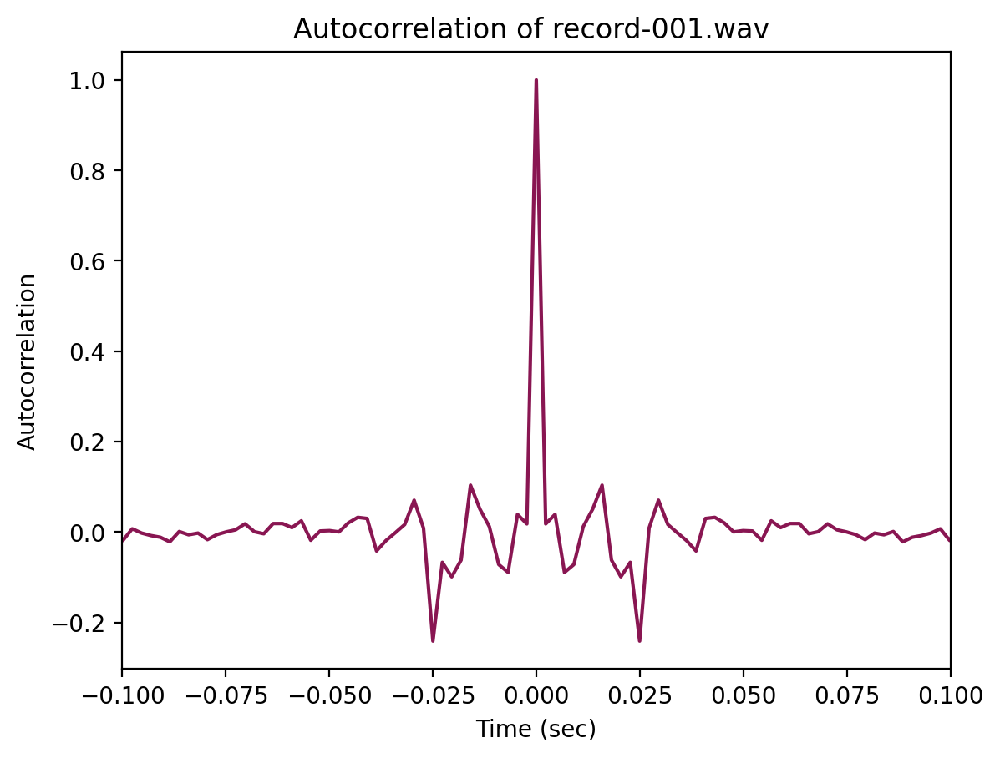

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sgn
from scipy.io import wavfile
from IPython.display import Audio, display


def auto_correlation(file, order = 4, cut_off_frequency = 500, dt = 0.025):
    "LOADING DATA"
    rate, S = wavfile.read(file)                        
    
    "FILTERING FOR SIGNAL DENOISING" 
    norm_cut_off = cut_off_frequency / (0.5 * rate) 
    b, a = sgn.butter(order, norm_cut_off, btype = 'high', analog = False) 
    filtered_signal = sgn.filtfilt(b, a, S)
   #T = np.linspace(0, len(S)/rate, num = length) 
    
    "SMOOTHING W/ GAUSSIAN WINDOW"
    trange = int(dt * rate)
    sigma = trange/4
    window = np.arange(-trange//2, trange//2)
    gaussian = np.exp(-(window/sigma)**2)
    signal_smoothed_gaussian = np.convolve(filtered_signal, gaussian, mode = 'same')
    
    "AUTO-CORRELATION"
    E = signal_smoothed_gaussian[::100]
    Ac = np.correlate(E, E, mode = 'same') / (E**2).sum()
    T = .5*np.linspace(-len(S)/rate, +len(S)/rate , len(Ac))
    return T, Ac


filename = "C:/Users/huawei/Documents/M2 Python course/PythonProject_records/record-001.wav"
print (filename) 

T, Ac = auto_correlation(filename)
#print(len(T), len(Ac))

plt.plot(T, Ac, color = '#891652')
plt.xlabel("Time (sec)")
plt.ylabel("Autocorrelation")
plt.title("Autocorrelation of {} ".format(filename[-14:]))
plt.xlim(-0.1,0.1)
plt.show()
   
    

### 7. Batch processing

So far, we've working with a unique file whose name was known to us. We would like now to process all the wav files in the data directory. This means we need to first find them and then process them. To do that, we'll use the [glob](https://docs.python.org/3/library/glob.html) library:

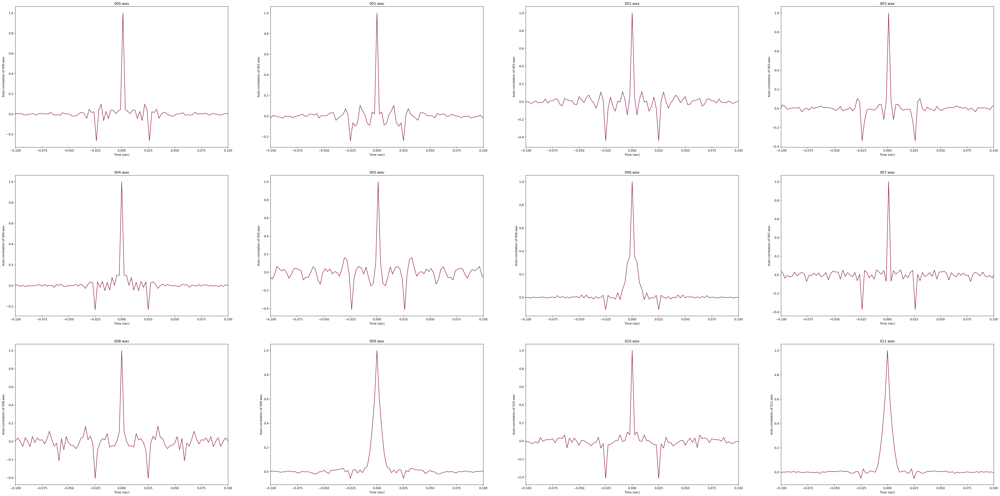

In [89]:
import glob
file_name_list = glob.glob("C:/Users/huawei/Documents/M2 Python course/PythonProject_records/*.wav")[:12] # can you understand what does this line do?
# this line retrieves a list of all burd songs files in the records directory.
plt.figure(figsize = (60, 40))

# Let's plot some data
ax = None
for index, filename in enumerate(file_name_list):
    single_file = file_name_list[index]
    T, Ac = auto_correlation(single_file)
    ax = plt.subplot(len(file_name_list) // 4 + 1, 4, index + 1) #ax = plt.subplot(num_rows, num_cols, index + 1)
    ax.plot(T, Ac, color = '#891652');
    ax.set_xlim(-0.1, 0.1);
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("Auto-correlation of {}".format(filename[-7:]))
    ax.set_title(filename[-7:])
plt.show() 


### 8. Fit the signal

the auto-correlation of adults is much more complicated than the one of juveniles. The juveniles look like a kind of Gaussian while the adults look like a periodic Gaussian. Consequently, if we try to fit juveniles with a Gaussian, the difference between the fit and the actual signal might be relatively small while for adults it shoudl be much bigger.



C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\3579749216.py:23: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 6000) # maxfev optimization algorithm that can evaluate the fitting function up to 6000 times


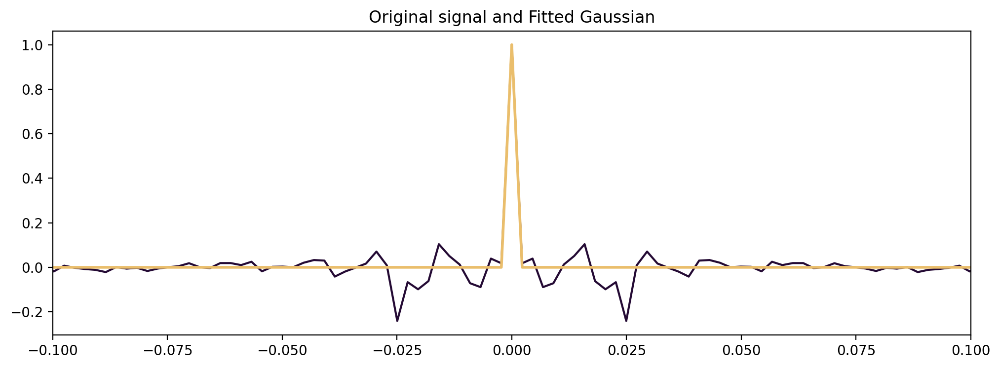

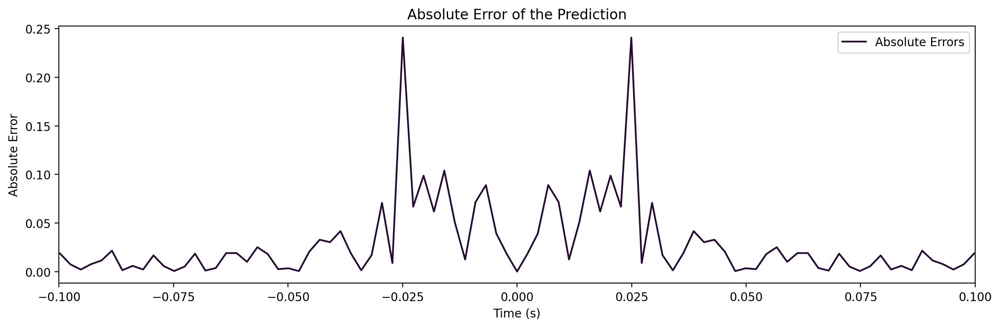

Score: 0.009505942099905058


In [92]:
from scipy.optimize import curve_fit

# Gaussian we want to use for fitting
def exponential(X, a, b, c):
    return a*np.exp(-((X/b)**2)) + c
    
# We get the auto-correlation of the ./records/record-001.wav
filename = "C:/Users/huawei/Documents/M2 Python course/PythonProject_records/record-001.wav"
T, Ac = auto_correlation(filename)

# We extract the value between tmin and tmax
t_min = -0.1
t_max = 0.1
time_mask = (T >= t_min) & (T <= t_max)
T_filtered = T[time_mask]
Ac_filtered = Ac[time_mask]

# Fit the curve
A_initial = np.max(Ac_filtered)  # Maximum value as initial amplitude
mu_initial = np.mean(T_filtered)  # Mean of x-values
sigma_initial = np.std(T_filtered)  # Standard deviation of x-values
initial_guess = [A_initial, mu_initial, sigma_initial]
params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 6000) # maxfev optimization algorithm that can evaluate the fitting function up to 6000 times
G = exponential(T, *params) # * is to include all parameters for function

# We display the result
plt.figure(figsize = (12, 4), dpi = 100);
plt.plot(T, Ac, color = '#240A34');
plt.plot(T, G, color = '#EABE6C', lw = 2);
plt.xlim(-0.1, 0.1)
plt.title("Original signal and Fitted Gaussian");
plt.show()


# We compute the score
from sklearn.metrics import mean_absolute_error
absolute_errors = np.abs(Ac - G)
score = mean_absolute_error(Ac, G)

plt.figure(figsize = (12, 4))
plt.plot(T, absolute_errors, label = 'Absolute Errors', color = '#240A34')
plt.xlim(-0.1, 0.1)
plt.xlabel('Time (s)')
plt.ylabel('Absolute Error')
plt.title('Absolute Error of the Prediction')
plt.legend()

plt.tight_layout()
plt.show()

#diff = abs(G-Ac)
#score = scipy.integrate.trapezoid(diff, T) #he trapezoidal rule to compute data integral in diff
#plt.figure(figsize = (12, 4), dpi = 100);
#plt.plot(T, diff)
#plt.xlim(-0.1, 0.1)
#plt.show()

# We print the score
print("Score: {0}".format(score)) 

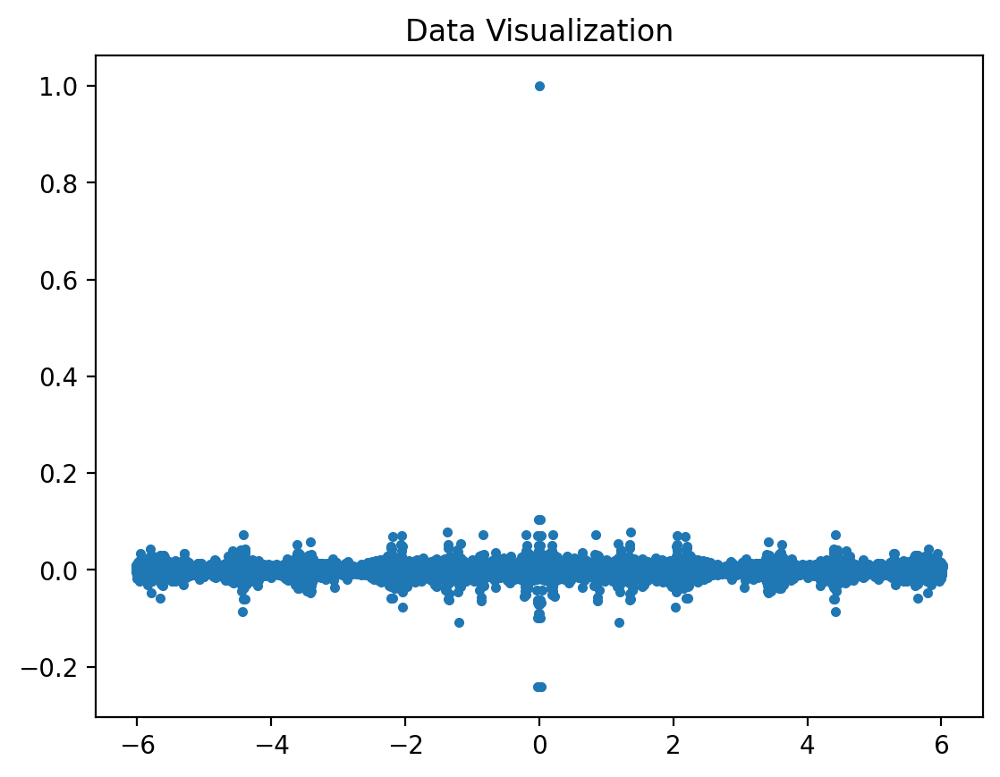

In [93]:
#JUST FOR ME TO REFIND INITIAL GUESSES
plt.plot(T, Ac, '.')  # Scatter plot of your data
plt.title('Data Visualization')
plt.show()


In [95]:
from scipy import optimize, integrate
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error
import glob

def score(file, t_min = -0.5, t_max = 0.5):
    
    ''' Gaussian '''
    def exponential(X, a, b, c):
        return a*np.exp(-((X/b)**2)) + c
   
    
    ''' Auto-correlation'''
    order = 4
    cut_off_frequency = 500
    dt = 0.025
    rate, S = wavfile.read(file)
    norm_cut_off = cut_off_frequency / (0.5 * rate) 
    b, a = sgn.butter(order, norm_cut_off, btype = 'high', analog = False) 
    filtered_signal = sgn.filtfilt(b, a, S)
    trange = int(dt * rate)
    sigma = trange/4
    window = np.arange(-trange//2, trange//2)
    gaussian = np.exp(-(window/sigma)**2)
    signal_smoothed_gaussian = np.convolve(filtered_signal, gaussian, mode = 'same')
    E = signal_smoothed_gaussian[::100]
    Ac = np.correlate(E, E, mode = 'same') / (E**2).sum()
    T = .5*np.linspace(-len(S)/rate, +len(S)/rate , len(Ac))
    
    
    ''' Extract value between t_max and t_min'''
    time_mask = (T >= t_min) & (T <= t_max)
    T_filtered = T[time_mask]
    Ac_filtered = Ac[time_mask]

    ''' Curve fit with Gaussian window '''
    initial_guess = [np.max(Ac_filtered), np.mean(T_filtered), np.std(T_filtered)]
    params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000) 
    G = exponential(T, *params) 

    ''' Score'''
 #    IDEA WAS GOOD BUT IDEA DIDNT WORK
#    Ac_min, Ac_max = np.min(Ac), np.max(Ac) # IDEA WAS GOOD BUT IDEA DIDNT WORK
#    Ac_norm = (Ac - Ac_min) / (Ac_max - Ac_min) * 100
#    G_min, G_max = np.min(G), np.max(G)
#    G_norm = (G - G_min) / (G_max - G_min) * 100
#    abs_error = np.abs(Ac_norm - G_norm)
#    sum_abs_error = np.sum(abs_error)  
#    score = mean_absolute_error(Ac_filtered, G_norm)
    
    score = mean_absolute_error(Ac, G)
    return score


# TEST
file_name_list = glob.glob("C:/Users/huawei/Documents/M2 Python course/PythonProject_records/*.wav")[:10] 
   
for index, filename in enumerate(file_name_list): 
    single_file = filename    
    signal_score = score(single_file)
    print("{0} : {1}".format(single_file[-15:], signal_score))

C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-000.wav : 0.007344134976665329
\record-001.wav : 0.00950594210082196
\record-002.wav : 0.008540121848292838


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-003.wav : 0.007403195193055794
\record-004.wav : 0.008598420445487441
\record-005.wav : 0.008112760167047019
\record-006.wav : 0.006582738198714857
\record-007.wav : 0.01018770607917284
\record-008.wav : 0.009247315071450652
\record-009.wav : 0.004105614120985974


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


### 9. Processing files


In [100]:
from tqdm import notebook
file_name_list = glob.glob("C:/Users/huawei/Documents/M2 Python course/PythonProject_records/*.wav")[:140] 


scores = []

for index, filename in enumerate(file_name_list): 
    single_file = filename    
    signal_score = score(single_file)
    print("{0} : {1}".format(single_file[-15:], signal_score))
    scores.append(score(single_file))

C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-000.wav : 0.007344134976665329


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-001.wav : 0.00950594210082196


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-002.wav : 0.008540121848292838


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-003.wav : 0.007403195193055794


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-004.wav : 0.008598420445487441
\record-005.wav : 0.008112760167047019


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-006.wav : 0.006582738198714857


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-007.wav : 0.01018770607917284
\record-008.wav : 0.009247315071450652


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-009.wav : 0.004105614120985974


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-010.wav : 0.010727225335286255


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-011.wav : 0.0032691114833771104


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-012.wav : 0.00669849852155031


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-013.wav : 0.00859866126340978


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-014.wav : 0.0035483768030100853
\record-015.wav : 0.012986792166101399


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-016.wav : 0.013491597307752585


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-017.wav : 0.009842052303743977


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-018.wav : 0.008354777326821404


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-019.wav : 0.00794892600425863


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-020.wav : 0.009494027283487704


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-021.wav : 0.012259102689906
\record-022.wav : 0.008388717313413634


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-023.wav : 0.010498623926366612


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-024.wav : 0.0063554094810678


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-025.wav : 0.00966362229074553


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-026.wav : 0.007872235494252321


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-027.wav : 0.009292677756594531


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-028.wav : 0.00636016920023771


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-029.wav : 0.00677713737796205


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-030.wav : 0.008483478795642214


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-031.wav : 0.010487644332985716


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-032.wav : 0.0012460097027877824


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-033.wav : 0.004559396785436388


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-034.wav : 0.003572991609577645


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-035.wav : 0.007352297482057285


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-036.wav : 0.007360320250680969
\record-037.wav : 0.007715492473640315


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-038.wav : 0.015500782447329288
\record-039.wav : 0.008363560098052662


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covari

\record-040.wav : 0.008966304122964166


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-041.wav : 0.005477924101352844


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-042.wav : 0.008393877170885428


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-043.wav : 0.009269784304340502


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-044.wav : 0.01030795851497315


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-045.wav : 0.009549095084669185


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-046.wav : 0.011475636774901096
\record-047.wav : 0.007427600829073502


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-048.wav : 0.011184971998296878
\record-049.wav : 0.009689456774725207


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-050.wav : 0.003302791122459352


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-051.wav : 0.0037414432493719416


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-052.wav : 0.00985439167416929


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-053.wav : 0.007644922043421919


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-054.wav : 0.009000150950393774


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-055.wav : 0.012020771301505495
\record-056.wav : 0.01086127681146482


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-057.wav : 0.011823449436797112


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-058.wav : 0.0077787841206346554


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-059.wav : 0.010415857549877106


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-060.wav : 0.007487708153100056


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-061.wav : 0.009585068235716143


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-062.wav : 0.008421751043741823


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-063.wav : 0.004918419476000192


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-064.wav : 0.009244310329466097
\record-065.wav : 0.011124239593358325


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-066.wav : 0.014372002790568876
\record-067.wav : 0.012460252943036093


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-068.wav : 0.0037132660279993305


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-069.wav : 0.010595505721423547


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-070.wav : 0.007769028360990765


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-071.wav : 0.010801211657012083


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-072.wav : 0.01079463896888235


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-073.wav : 0.00898722023021674


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-074.wav : 0.009548281129543144


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-075.wav : 0.010635627014849361


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-076.wav : 0.010810429824502884
\record-077.wav : 0.011869395508566652


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-078.wav : 0.006737360041633476


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-079.wav : 0.011746593606510357


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-080.wav : 0.008912123868769163


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-081.wav : 0.005711794477757929
\record-082.wav : 0.011136061402355141


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covari

\record-083.wav : 0.010664091139276187


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-084.wav : 0.008559895806438702


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-085.wav : 0.011260744281011533


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-086.wav : 0.009490494612190927
\record-087.wav : 0.014492708613215695


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-088.wav : 0.009801569089561939


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-089.wav : 0.002916940848870963


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-090.wav : 0.004556788667630164


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-091.wav : 0.013368198193750623


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-092.wav : 0.009266190632990565


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-093.wav : 0.01048816873400575


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-094.wav : 0.011255969507997995


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-095.wav : 0.007494415525965248


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-096.wav : 0.009712774601546398


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-097.wav : 0.011051107700991035


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-098.wav : 0.005746073087566354


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-099.wav : 0.009654555415233435


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-100.wav : 0.008371074621832812


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-101.wav : 0.0028011875448453153


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-102.wav : 0.006755846591086771


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-103.wav : 0.008669320485726278


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-104.wav : 0.014181070739772476
\record-105.wav : 0.014028751038858022


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-106.wav : 0.01083001496930984


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-107.wav : 0.0033163197313104006


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-108.wav : 0.0034428362804627965


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-109.wav : 0.012363584777176456


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-110.wav : 0.003451230114968035


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-111.wav : 0.004993780642550071


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-112.wav : 0.010450643036914802


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-113.wav : 0.011806897953471408


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-114.wav : 0.0076888533693323866


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-115.wav : 0.005671317790079233


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-116.wav : 0.013557241560984775
\record-117.wav : 0.004325161425045238


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-118.wav : 0.008267847403197555


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-119.wav : 0.010937418898137558


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-120.wav : 0.01026353815077882


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-121.wav : 0.006628227482154473


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-122.wav : 0.008911974852599197
\record-123.wav : 0.011386739351949077


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covari

\record-124.wav : 0.00659046360063807


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-125.wav : 0.007221804840288778


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-126.wav : 0.010076191391443416


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-127.wav : 0.007434011547843075


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-128.wav : 0.004503118691731373


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-129.wav : 0.008861124855398868


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-130.wav : 0.011667201552438076


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-131.wav : 0.009640506200240975


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-132.wav : 0.009287948740053635
\record-133.wav : 0.0037951989828855425


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-134.wav : 0.008306332297356727


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-135.wav : 0.006898403873642278


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-136.wav : 0.011601621146657828
\record-137.wav : 0.013518002665562695


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-138.wav : 0.006180874095632328


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-139.wav : 0.008566633236752098


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1947093954.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


In [102]:
print("Number of scores:", len(scores))
print("\n".join(map(str, scores)))

Number of scores: 140
0.007344134976665329
0.00950594210082196
0.008540121848292838
0.007403195193055794
0.008598420445487441
0.008112760167047019
0.006582738198714857
0.01018770607917284
0.009247315071450652
0.004105614120985974
0.010727225335286255
0.0032691114833771104
0.00669849852155031
0.00859866126340978
0.0035483768030100853
0.012986792166101399
0.013491597307752585
0.009842052303743977
0.008354777326821404
0.00794892600425863
0.009494027283487704
0.012259102689906
0.008388717313413634
0.010498623926366612
0.0063554094810678
0.00966362229074553
0.007872235494252321
0.009292677756594531
0.00636016920023771
0.00677713737796205
0.008483478795642214
0.010487644332985716
0.0012460097027877824
0.004559396785436388
0.003572991609577645
0.007352297482057285
0.007360320250680969
0.007715492473640315
0.015500782447329288
0.008363560098052662
0.008966304122964166
0.005477924101352844
0.008393877170885428
0.009269784304340502
0.01030795851497315
0.009549095084669185
0.011475636774901096
0.

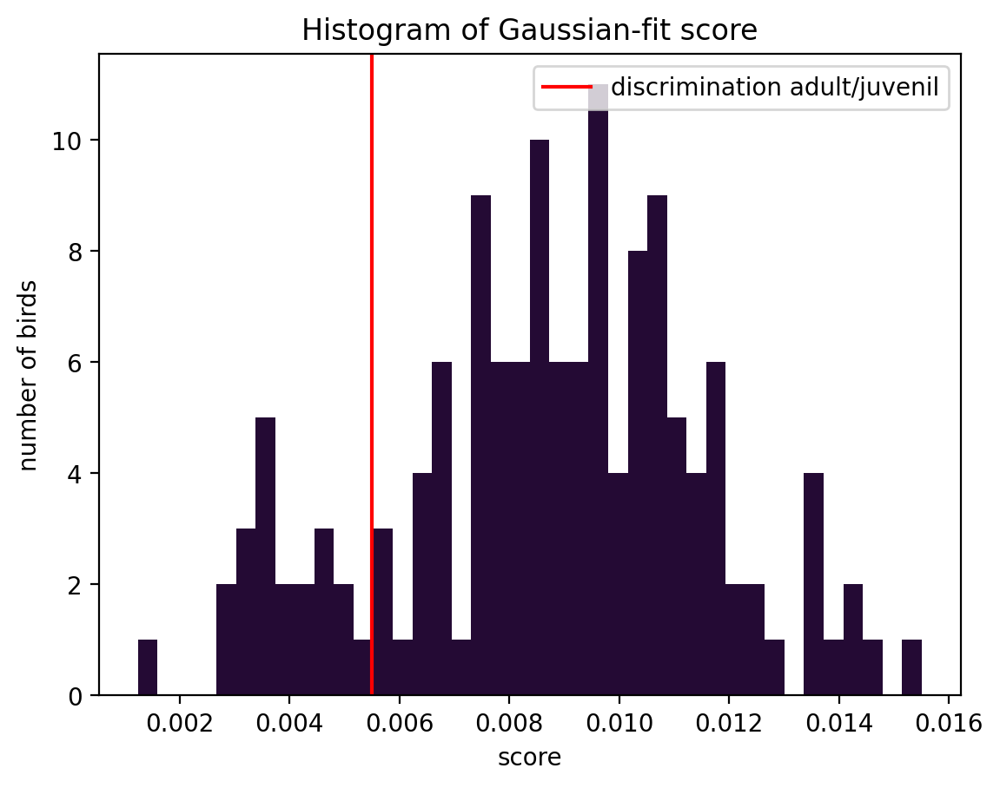

In [104]:
plt.hist(scores, bins = 40, color = '#240A34')
plt.xlabel("score")
plt.ylabel("number of birds")
plt.title("Histogram of Gaussian-fit score");
plt.axvline(0.0055, color = "red", label = "discrimination adult/juvenil")
plt.legend()
plt.show()

We can clearly see on the graph above that there are two different groups of score. Visually, the frontiers between the two groups seems to be a score of 20.

In [106]:
# I have different result so I will continue with my numbers 
#scores = np.array(scores)
#print( (scores < 20).sum(), (20 <= scores).sum())

## 10. PUT EVERYTHING TOGETHER 

********************************************************************************
           SCORE CALCULATION            
********************************************************************************


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-000.wav : 0.007344134976665329
\record-001.wav : 0.00950594210082196


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-002.wav : 0.008540121848292838


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-003.wav : 0.007403195193055794


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-004.wav : 0.008598420445487441


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-005.wav : 0.008112760167047019


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-006.wav : 0.006582738198714857


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-007.wav : 0.01018770607917284
\record-008.wav : 0.009247315071450652


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-009.wav : 0.004105614120985974


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-010.wav : 0.010727225335286255


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-011.wav : 0.0032691114833771104


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-012.wav : 0.00669849852155031


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-013.wav : 0.00859866126340978


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-014.wav : 0.0035483768030100853
\record-015.wav : 0.012986792166101399
\record-016.wav : 0.013491597307752585


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covari

\record-017.wav : 0.009842052303743977


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-018.wav : 0.008354777326821404
\record-019.wav : 0.00794892600425863


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-020.wav : 0.009494027283487704


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-021.wav : 0.012259102689906
\record-022.wav : 0.008388717313413634


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-023.wav : 0.010498623926366612


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-024.wav : 0.0063554094810678


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-025.wav : 0.00966362229074553


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-026.wav : 0.007872235494252321


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-027.wav : 0.009292677756594531


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-028.wav : 0.00636016920023771


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-029.wav : 0.00677713737796205


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-030.wav : 0.008483478795642214


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-031.wav : 0.010487644332985716


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-032.wav : 0.0012460097027877824


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-033.wav : 0.004559396785436388


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-034.wav : 0.003572991609577645


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-035.wav : 0.007352297482057285


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-036.wav : 0.007360320250680969
\record-037.wav : 0.007715492473640315
\record-038.wav : 0.015500782447329288


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covari

\record-039.wav : 0.008363560098052662


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-040.wav : 0.008966304122964166


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-041.wav : 0.005477924101352844


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-042.wav : 0.008393877170885428


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-043.wav : 0.009269784304340502
\record-044.wav : 0.01030795851497315


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covari

\record-045.wav : 0.009549095084669185
\record-046.wav : 0.011475636774901096


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-047.wav : 0.007427600829073502
\record-048.wav : 0.011184971998296878


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-049.wav : 0.009689456774725207


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-050.wav : 0.003302791122459352


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-051.wav : 0.0037414432493719416


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-052.wav : 0.00985439167416929


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-053.wav : 0.007644922043421919


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-054.wav : 0.009000150950393774
\record-055.wav : 0.012020771301505495


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-056.wav : 0.01086127681146482


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-057.wav : 0.011823449436797112


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-058.wav : 0.0077787841206346554


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-059.wav : 0.010415857549877106


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-060.wav : 0.007487708153100056


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-061.wav : 0.009585068235716143


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-062.wav : 0.008421751043741823


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-063.wav : 0.004918419476000192


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-064.wav : 0.009244310329466097
\record-065.wav : 0.011124239593358325


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-066.wav : 0.014372002790568876
\record-067.wav : 0.012460252943036093


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-068.wav : 0.0037132660279993305
\record-069.wav : 0.010595505721423547


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-070.wav : 0.007769028360990765


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-071.wav : 0.010801211657012083


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-072.wav : 0.01079463896888235


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-073.wav : 0.00898722023021674


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-074.wav : 0.009548281129543144


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-075.wav : 0.010635627014849361
\record-076.wav : 0.010810429824502884


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-077.wav : 0.011869395508566652


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-078.wav : 0.006737360041633476


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-079.wav : 0.011746593606510357


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-080.wav : 0.008912123868769163
\record-081.wav : 0.005711794477757929


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-082.wav : 0.011136061402355141


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-083.wav : 0.010664091139276187


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-084.wav : 0.008559895806438702
\record-085.wav : 0.011260744281011533


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covari

\record-086.wav : 0.009490494612190927
\record-087.wav : 0.014492708613215695


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-088.wav : 0.009801569089561939


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-089.wav : 0.002916940848870963


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-090.wav : 0.004556788667630164
\record-091.wav : 0.013368198193750623


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-092.wav : 0.009266190632990565


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-093.wav : 0.01048816873400575
\record-094.wav : 0.011255969507997995


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-095.wav : 0.007494415525965248


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-096.wav : 0.009712774601546398


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-097.wav : 0.011051107700991035


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-098.wav : 0.005746073087566354


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-099.wav : 0.009654555415233435


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-100.wav : 0.008371074621832812


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-101.wav : 0.0028011875448453153


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-102.wav : 0.006755846591086771


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-103.wav : 0.008669320485726278
\record-104.wav : 0.014181070739772476


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-105.wav : 0.014028751038858022


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-106.wav : 0.01083001496930984


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-107.wav : 0.0033163197313104006


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-108.wav : 0.0034428362804627965
\record-109.wav : 0.012363584777176456


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-110.wav : 0.003451230114968035


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-111.wav : 0.004993780642550071


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-112.wav : 0.010450643036914802
\record-113.wav : 0.011806897953471408


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-114.wav : 0.0076888533693323866


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covari

\record-115.wav : 0.005671317790079233
\record-116.wav : 0.013557241560984775


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-117.wav : 0.004325161425045238


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-118.wav : 0.008267847403197555
\record-119.wav : 0.010937418898137558


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-120.wav : 0.01026353815077882


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-121.wav : 0.006628227482154473


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-122.wav : 0.008911974852599197
\record-123.wav : 0.011386739351949077


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-124.wav : 0.00659046360063807


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-125.wav : 0.007221804840288778


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-126.wav : 0.010076191391443416


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-127.wav : 0.007434011547843075
\record-128.wav : 0.004503118691731373


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-129.wav : 0.008861124855398868


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-130.wav : 0.011667201552438076


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-131.wav : 0.009640506200240975


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-132.wav : 0.009287948740053635


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-133.wav : 0.0037951989828855425


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-134.wav : 0.008306332297356727


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-135.wav : 0.006898403873642278
\record-136.wav : 0.011601621146657828


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-137.wav : 0.013518002665562695


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)
C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-138.wav : 0.006180874095632328


C:\Users\huawei\AppData\Local\Temp\ipykernel_32056\1265502316.py:61: OptimizeWarning: Covariance of the parameters could not be estimated
  params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000)


\record-139.wav : 0.008566633236752098


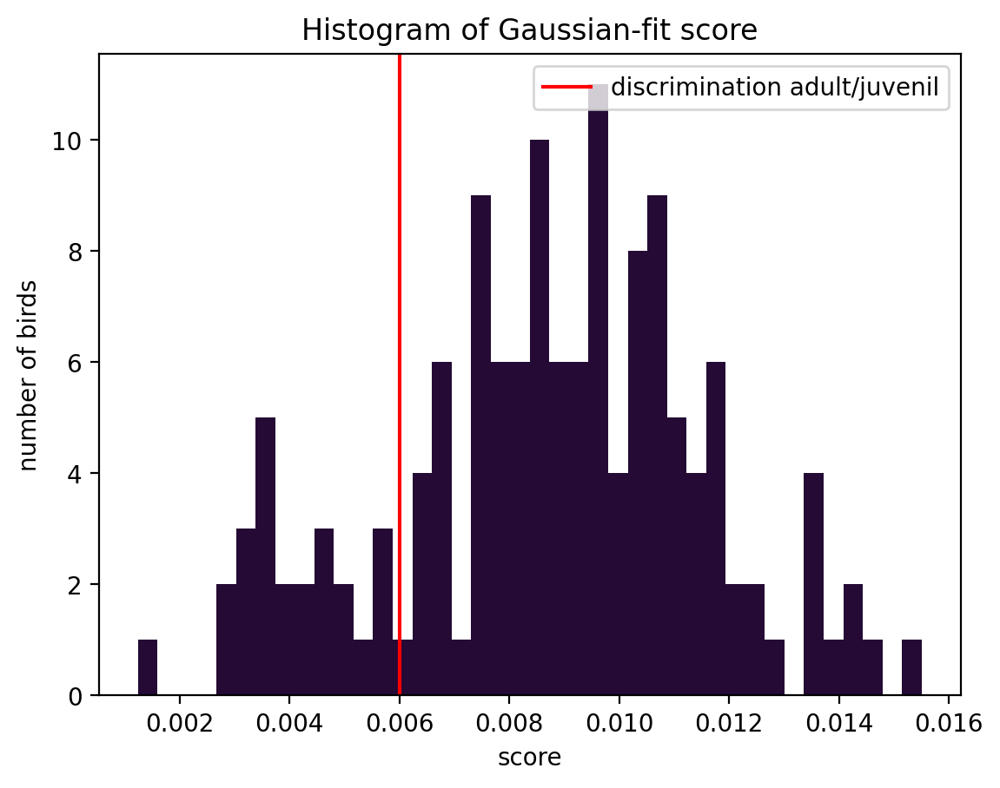

adult
juvenile


In [108]:
# LIBRARY IMPORT 
import numpy as np
import scipy
import scipy.signal as sgn
from scipy.io import wavfile
from scipy import optimize, integrate
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import glob
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error
from scipy.interpolate import interp1d

# ALL FUNCTIONS TO USE
def get_data(filename = None):
    rate, S = wavfile.read(filename)
    return rate, S

def exponential(X, a, b, c):
    return a*np.exp(-((X/b)**2)) + c

def auto_correlation(F, order = 4, cut_off_frequency = 500, dt = 0.025):
    "LOADING DATA"
    rate, S = wavfile.read(F)                        
    
    "FILTERING FOR SIGNAL DENOISING" 
    norm_cut_off = cut_off_frequency / (0.5 * rate) 
    b, a = sgn.butter(order, norm_cut_off, btype = 'high', analog = False) 
    filtered_signal = sgn.filtfilt(b, a, S)
   #T = np.linspace(0, len(S)/rate, num = length) 
    
    "SMOOTHING W/ GAUSSIAN WINDOW"
    trange = int(dt * rate)
    sigma = trange/4
    window = np.arange(-trange//2, trange//2)
    gaussian = np.exp(-(window/sigma)**2)
    signal_smoothed_gaussian = np.convolve(filtered_signal, gaussian, mode = 'same')
    
    "AUTO-CORRELATION"
    E = signal_smoothed_gaussian[::100]
    Ac = np.correlate(E, E, mode = 'same') / (E**2).sum()
    T = .5*np.linspace(-len(S)/rate, +len(S)/rate , len(Ac))
    return T, Ac


def score(file, t_min = -0.5, t_max = 0.5):
    ''' Gaussian '''
    def exponential(X, a, b, c):
        return a*np.exp(-((X/b)**2)) + c
   
    ''' Auto-correlation'''
    T, Ac = auto_correlation(file)
        
    ''' Extract value between t_max and t_min'''
    time_mask = (T >= t_min) & (T <= t_max)
    T_filtered = T[time_mask]
    Ac_filtered = Ac[time_mask]

    ''' Curve fit with Gaussian window '''
    initial_guess = [np.max(Ac_filtered), np.mean(T_filtered), np.std(T_filtered)]
    params, covariance = curve_fit(exponential, T, Ac, p0 = initial_guess, maxfev = 10000) 
    G = exponential(T, *params)
    
    ''' Score'''
    score = mean_absolute_error(Ac, G)
    return score

def songsort(file_name_list, scores):
    #empty dictionary
    AJ_dict = {
        "adult": [],
        "juvenile": []
    }
    
    # Categorize based on score
    for index, filename in enumerate(file_name_list):
         if scores[index] > 0.006:
            AJ_dict["adult"].append(filename[-14:])
         else:
            AJ_dict["juvenile"].append(filename[-14:])          
    return AJ_dict


# SCRIPT MAIN BODY
'''load the data'''
file_name_list = glob.glob("C:/Users/huawei/Documents/M2 Python course/PythonProject_records/*.wav")[:140] #So long path bcz on my laptop it didnt work another way :) 

'''scores'''
message = "SCORE CALCULATION"
centered_message = message.center(40)
print("*" * 80)
print(centered_message)
print("*" * 80)

scores = []
for index, filename in enumerate(file_name_list): 
    single_file = filename    
    signal_score = score(single_file)
    scores.append(score(single_file))
    print("{0} : {1}".format(single_file[-15:], signal_score))

'''histogram'''
plt.hist(scores, bins = 40, color = '#240A34')
plt.xlabel("score")
plt.ylabel("number of birds")
plt.title("Histogram of Gaussian-fit score");
plt.axvline(0.006, color = "red", label = "discrimination adult/juvenil")
plt.legend()
plt.show()

'''birds sorting'''
scores = np.array(scores)
bird_categories = songsort(file_name_list, scores)
print("\n".join(map(str, bird_categories)))



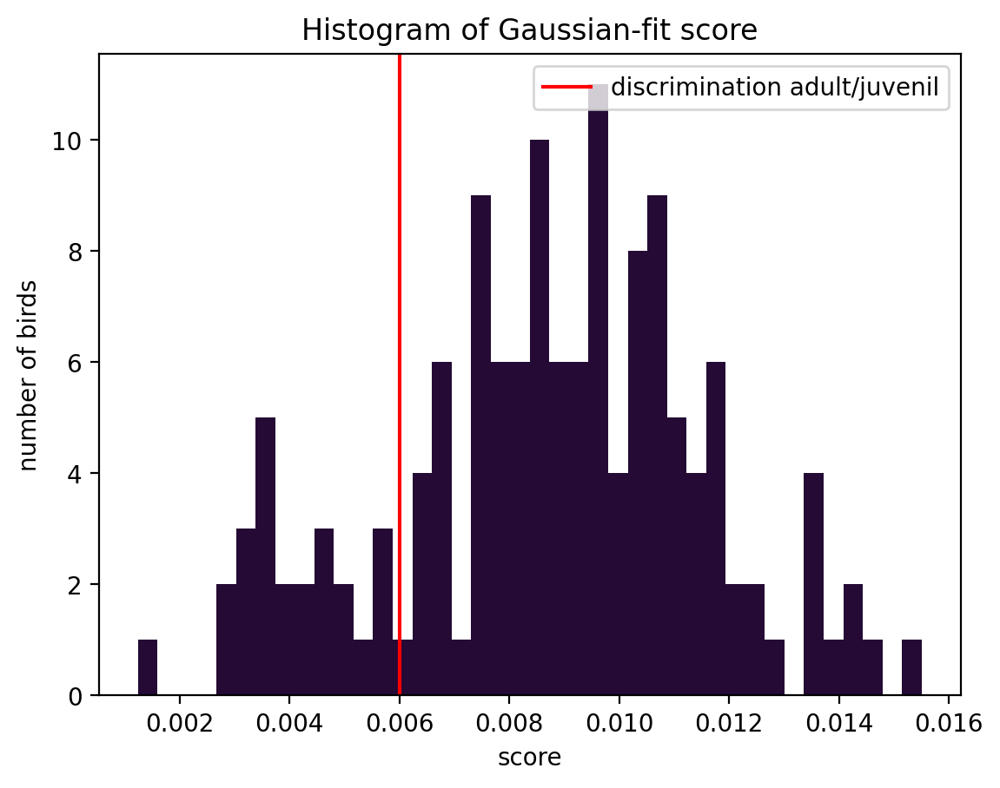

adult
juvenile


In [109]:
'''histogram'''
plt.hist(scores, bins = 40, color = '#240A34')
plt.xlabel("score")
plt.ylabel("number of birds")
plt.title("Histogram of Gaussian-fit score");
plt.axvline(0.006, color = "red", label = "discrimination adult/juvenil")
plt.legend()
plt.show()

'''birds sorting'''
scores = np.array(scores)
bird_categories = songsort(file_name_list, scores)
print("\n".join(map(str, bird_categories)))

In [110]:
#if u wanna see names of the files with adult/juvenil
bird_categories = songsort(file_name_list, scores)

adults = bird_categories["adult"]
juveniles = bird_categories["juvenile"]
max_length = max(len(adults), len(juveniles))
print(f"{'Adult Birds':<20} {'Juvenile Birds':<20}")
print("-" * 40)  # Separator line

for i in range(max_length):
    adult_bird = adults[i] if i < len(adults) else ""
    juvenile_bird = juveniles[i] if i < len(juveniles) else ""
    print(f"{adult_bird:<20} {juvenile_bird:<20}")

Adult Birds          Juvenile Birds      
----------------------------------------
record-000.wav       record-009.wav      
record-001.wav       record-011.wav      
record-002.wav       record-014.wav      
record-003.wav       record-032.wav      
record-004.wav       record-033.wav      
record-005.wav       record-034.wav      
record-006.wav       record-041.wav      
record-007.wav       record-050.wav      
record-008.wav       record-051.wav      
record-010.wav       record-063.wav      
record-012.wav       record-068.wav      
record-013.wav       record-081.wav      
record-015.wav       record-089.wav      
record-016.wav       record-090.wav      
record-017.wav       record-098.wav      
record-018.wav       record-101.wav      
record-019.wav       record-107.wav      
record-020.wav       record-108.wav      
record-021.wav       record-110.wav      
record-022.wav       record-111.wav      
record-023.wav       record-115.wav      
record-024.wav       record-117.wav

In [111]:
#if u wanna see names of the files with adult/juvenil by interaction with user
'''dictionary birds sorting call'''
category = input("Which category would you like to see? (adult/juvenile): ").strip().lower()
if category in bird_categories:
    birds = bird_categories[category]
    print(f"{category.capitalize()} birds:\n" + "\n".join(birds))
else:
    print("Invalid category. Please choose 'adult' or 'juvenile'.")

Which category would you like to see? (adult/juvenile):  adult


Adult birds:
record-000.wav
record-001.wav
record-002.wav
record-003.wav
record-004.wav
record-005.wav
record-006.wav
record-007.wav
record-008.wav
record-010.wav
record-012.wav
record-013.wav
record-015.wav
record-016.wav
record-017.wav
record-018.wav
record-019.wav
record-020.wav
record-021.wav
record-022.wav
record-023.wav
record-024.wav
record-025.wav
record-026.wav
record-027.wav
record-028.wav
record-029.wav
record-030.wav
record-031.wav
record-035.wav
record-036.wav
record-037.wav
record-038.wav
record-039.wav
record-040.wav
record-042.wav
record-043.wav
record-044.wav
record-045.wav
record-046.wav
record-047.wav
record-048.wav
record-049.wav
record-052.wav
record-053.wav
record-054.wav
record-055.wav
record-056.wav
record-057.wav
record-058.wav
record-059.wav
record-060.wav
record-061.wav
record-062.wav
record-064.wav
record-065.wav
record-066.wav
record-067.wav
record-069.wav
record-070.wav
record-071.wav
record-072.wav
record-073.wav
record-074.wav
record-075.wav
record-076.w

## THE END